<image src="https://raw.githubusercontent.com/ramiro999/pytorch-exploration/main/images/Banner-Hands-on-odep.png" width=100%>

## **Detección de objetos y estimación de la profundidad para entornos urbanos en el area metropolitana de Bucaramanga**

La detección de objetos y la estimación de la profundidad en entornos urbanos presentan desafíos únicos debido a las condiciones cambiantes de iluminación, las oclusiones y la variabilidad de los objetos. Este trabajo aborda estos desafíos mediante la implementación de arquitecturas de visión por computadora y aprendizaje profundo y el uso de conjuntos de datos de imágenes capturadas en diferentes escenarios de la ciudad de Bucaramanga.

De este modo, se espera que los resultados de esta investigación sirvan como base para el desarrollo de sistemas de asistencia a la conducción, drones de vigilancia y aplicaciones de realidad aumentada para la ciudad.

**Objetivos:**
* Creación y procesamiento del dataset de Bucaramanga con imágenes monocular.
* Detección de objetos para las imagenes con implementación DETR.
* Estimación de la profundidad con implementación DepthAnythingV2.
* Detección de objetos para los videos con implementación y Optimización para procesar secuencias de video con RT-DETR.

## **Paquetes**

In [ ]:
!pip install opencv-python
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install --upgrade transformers

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## **Librerias**


In [ ]:
import math # Funciones matemáticas
import numpy as np # Libreria de algebra lineal
from PIL import Image # Python Imaging Library
import requests # Realizar solicitudes HTTP
import matplotlib.pyplot as plt # Libreria para realizar visualizaciones
%config InlineBackend.figure_format = 'retina' # Configuración de de matplotlib para que las imagenes tengan mayor resolución
import os

#import ipywidgets as widgets
#from IPython.display import display, clear_output

import torch # Importar librería de Pytorch
from torch import nn # Importar librería de Pytorch para deep learning
from torchvision.models import resnet50 # Modelo de deep learning ResNet50
import torchvision.transforms as T # Transformaciones de imagenes y tensores
torch.set_grad_enabled(False); # Desactivar el cálculo de gradientes, se utiliza porque estamos trabajando con un modelo pre-entrenado
## Solo se realiza inferencia (Resultados del modelo pre-entrenado)

import cv2 as cv # Importar librería de open computer vision (cv)
import random


In [ ]:
#@title Conectar con Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Adquisición de datos - Datos de entrada**

Los datos de entrada son imágenes y videos de escenarios donde circula el tráfico de Bucaramanga, los cuales son el  barrio **La Universidad**, el parque **El Mesón De Los Búcaros**, **La Autopista de Floridablanca**  y parqueaderos de la **La Universidad Industrial de Santander**.

El dataset se encuentra aquí: https://github.com/ramiro999/BucaraSet.git

Estos datos fueron capturados con 2 cámaras diferentes, un *Iphone 13* y un *Iphone XR*


In [ ]:
# Procedemos a clonar el dataset de GitHub
!git clone https://github.com/ramiro999/BucaraSet.git

Cloning into 'BucaraSet'...
remote: Enumerating objects: 456, done.
remote: Counting objects: 100% (95/95), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 456 (delta 8), reused 95 (delta 8), pack-reused 361 (from 1)
Receiving objects: 100% (456/456), 1.59 GiB | 17.65 MiB/s, done.
Resolving deltas: 100% (10/10), done.
Updating files: 100% (418/418), done.


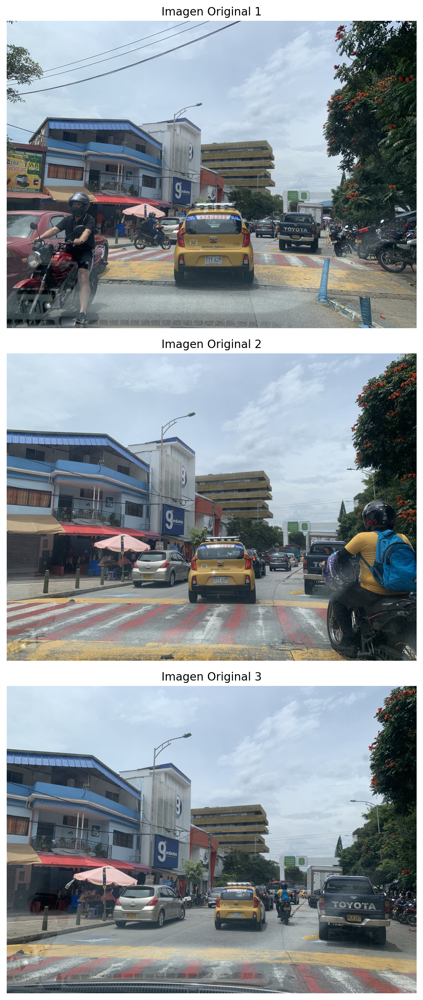

In [ ]:
# Configuración inicial
image_dir = '/content/BucaraSet/barrio-la-universidad/img/'
n_images = 3  # Número de imágenes

# Obtener una lista de todas las imágenes en el directorio
all_images = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Seleccionar n imágenes aleatorias de la lista
selected_images = random.sample(all_images, n_images)

# Seleccionar n imagenes de interes en una lista del directorio
selected_images = ['IMG_29.jpg', 'IMG_30.jpg', 'IMG_31.jpg']


plt.figure(figsize=(10, 5 * n_images))  # Ajusta el tamaño de la figura según la cantidad de imágenes, cada imagen tendrá 5 unidades de altura

# Bucle para visualizar cada imagen en su propia fila.
for i, image_name in enumerate(selected_images,1):
    image_path = os.path.join(image_dir, image_name)
    image = cv.imread(image_path)

    # Chequear si la imagen se cargo correctamente
    if image is None:
      print(f"Error loading image {image_path}")
      continue

    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image_pil = Image.fromarray(image)

    # Visualizar la imagen original
    plt.subplot(n_images, 1, i)  # n_images filas, 1 columna, índice i
    plt.imshow(image)
    plt.title(f'Imagen Original {i}')
    plt.axis('off')

plt.tight_layout()  # Ajusta el layout antes de mostrar la figura
plt.show()  # Muestra la figura completa una vez que todas las subplots han sido configuradas

In [ ]:
image.shape

(3024, 4032, 3)

## **Etiquetado de datos**


Para detectar los objetos es necesario contar con las clases en una lista, esta clases provienen de las super categorías de objetos del dataset COCO (Common Objects in Context) https://cocodataset.org/#home

Se utilizan 25 clases de 3 super categorías:
- *person*
- *vehicles*
- *animal*

Para cada clase se asigna un unico color para el cuadro delimitador mediante una secuencia de colores RGB aleatorios.

In [ ]:
# Clases del dataset COCO
# Son 25 clases en la lista
# 'N/A' aparece varias veces para mantener la correspondencia con los índices no utilizados en el conjunto de datos COCO.
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A'
]

# Colores para la visualización
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# Lista de clases excluyendo 'N/A'
filtered_classes = [cls for cls in CLASSES if cls != 'N/A']
num_classes = len(filtered_classes)

# Crear una secuencia de colores RGB
def generate_rgb_colors(num_colors):
    np.random.seed(0)  # Para reproducibilidad
    colors = np.random.rand(num_colors, 3)  # Generar colores aleatorios en RGB
    return colors.tolist()

COLORS = generate_rgb_colors(num_classes)

# Asociar cada clase con su color
class_to_color = {cls: COLORS[i] for i, cls in enumerate(filtered_classes)}

print(class_to_color)

{'person': [0.5488135039273248, 0.7151893663724195, 0.6027633760716439], 'bicycle': [0.5448831829968969, 0.4236547993389047, 0.6458941130666561], 'car': [0.4375872112626925, 0.8917730007820798, 0.9636627605010293], 'motorcycle': [0.3834415188257777, 0.7917250380826646, 0.5288949197529045], 'airplane': [0.5680445610939323, 0.925596638292661, 0.07103605819788694], 'bus': [0.08712929970154071, 0.02021839744032572, 0.832619845547938], 'train': [0.7781567509498505, 0.8700121482468192, 0.978618342232764], 'truck': [0.7991585642167236, 0.46147936225293185, 0.7805291762864555], 'boat': [0.11827442586893322, 0.6399210213275238, 0.1433532874090464], 'traffic light': [0.9446689170495839, 0.5218483217500717, 0.4146619399905236], 'fire hydrant': [0.26455561210462697, 0.7742336894342167, 0.45615033221654855], 'stop sign': [0.5684339488686485, 0.018789800436355142, 0.6176354970758771], 'parking meter': [0.6120957227224214, 0.6169339968747569, 0.9437480785146242], 'bench': [0.6818202991034834, 0.35950

## **Procesamiento de los datos**

Antes de que los datos entren en el modelo es necesario:

- **Preprocesar las imágenes:** Redimensionar, convertir a tensor y normalizar las imágenes de entrada para adaptarlas a las necesidades del modelo.

- **Post-procesar las salida del modelo:** Convertir las coordenadas de los cuadros delimitadores generados por la red a las coordenadas originales de la imagen.

In [ ]:
# Normalización de la imagen de entrada con el estandar media-std de PyTorch.
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Para el post-procesamiento del cuadro delimitador de salida.
def bboxes(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

# Reescalar los cuadros delimitadores
def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = bboxes(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [ ]:
image.shape

(3024, 4032, 3)

In [ ]:
def plot_results(ax, pil_img, prob, boxes, class_to_color):
  ax.imshow(pil_img)
  for p, (xmin, ymin, xmax, ymax) in zip(prob, boxes.tolist()):
    cl = p.argmax().item()
    if cl >= len(CLASSES):
        print(f"Warning: Predicted class index {cl} is out of range!")
        continue  # Saltar a la siguiente iteración si `cl` está fuera de rango
    class_name = CLASSES[cl]
    if class_name in class_to_color:
      color = class_to_color[class_name]
      ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, color=color, linewidth=3))
      ax.text(xmin, ymin, f'{class_name}: {p[cl]:0.2f}', fontsize=15, bbox=dict(facecolor='yellow', alpha=0.5))
  ax.axis('off')

## **Detección del objeto - Modelo pre-entrenado DETR**

Aquí cargamos el modelo más simple (DETR-R50) para una inferencia rápida.

Modelo DEtection TRansformer (DETR) entrenado de extremo a extremo en la detección de objetos de COCO 2017 (118 000 imágenes anotadas). Se introdujo en el artículo [End-to-End Object Detection with Transformers](https://arxiv.org/abs/2005.12872) de Carion et al. y se publicó por primera vez en este [repositorio](https://github.com/facebookresearch/detr).

El modelo DETR es un transformador codificador-decodificador con una columna vertebral convolucional. Se añaden dos cabezas sobre las salidas del descodificador para realizar la detección de objetos: una capa lineal para las etiquetas de clase y un MLP (perceptrón multicapa) para los recuadros delimitadores. El modelo utiliza las llamadas consultas de objeto para detectar objetos en una imagen. Cada consulta de objeto busca un objeto concreto en la imagen. En COCO, el número de consultas de objetos se fija en 100.


In [ ]:
#@title Carga del modelo pre-entrenado
detr_model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
detr_model.eval();

Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 82.6MB/s]
Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cach

In [ ]:
#@title Configuración de dispositivo y resumen del modelo.
#DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#detr_model.cuda()

Aplicamos un tratamiento previo, lo pasamos por el modelo y filtramos las predicciones. En concreto, conservamos sólo los objetos cuya confianza de clase es superior a 0,9 (descontando las predicciones de «no objeto»). Este umbral se puede reducir si se desea más predicciones.

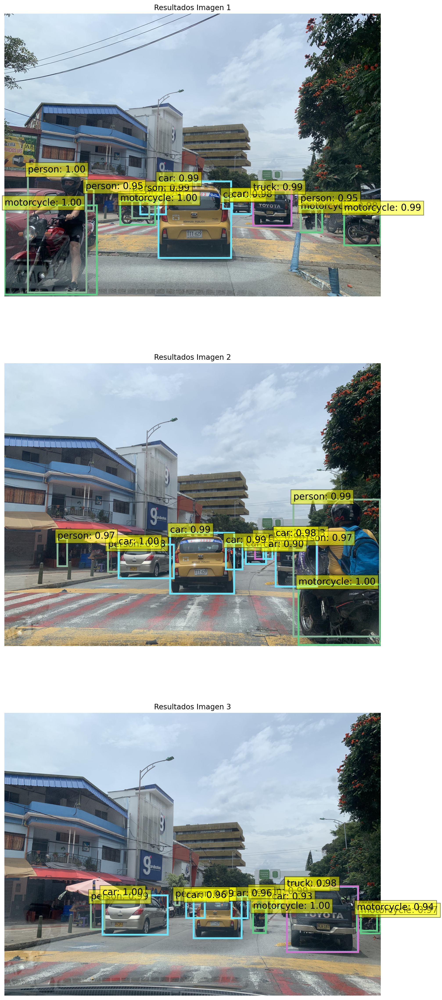

In [ ]:
#@title Inferencia
plt.figure(figsize=(10, 8 * n_images))  # Configuración de la figura general

for i, image_name in enumerate(selected_images,1):
    image_path = os.path.join(image_dir, image_name)
    image = cv.imread(image_path)

    # Chequear si la imagen se cargo correctamente
    if image is None:
      print(f"Error loading image {image_path}")
      continue

    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image_pil = Image.fromarray(image)

    # Parametros de configuración

    img_tensor = transform(image_pil).unsqueeze(0) # Metodo para el procesamiento de la imagen, 'unsqueze(0)' añade una dimensión adicional para simular un lote de tamaño 1
    # Ya que el modelo espera una entrada con formato [batch_size, channels, height, width]

    outputs = detr_model(img_tensor) # Se generan las predicciones de la red y realizar inferencia
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1] # Se aplican las funciones softmax a las predicciones de logits para obtener las probabilidades.
    # Esto convierte los logits en probabilidades, y se excluye la última clase, que normalmente es la clase de 'no objeto' o fondo.

    keep = probas.max(-1).values > 0.9 # Parametro para el umbral de probabilidad: se filtran las predicciones,
    # manteniendo solo aquellas donde la probabilidad máxima supere el 90%.
    # Este umbral afecta la precisión y el número de detecciones, eliminando las detecciones con baja confianza.

    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], image_pil.size)
    # Post-procesamiento para el escalado de las cajas delimitadoras
    # Este escalado es esencial para que las cajas coincidan con los objetos en la imagen.

    ax = plt.subplot(n_images, 1, i)  # Configuración de subplots individuales
    plot_results(ax, image_pil, probas[keep], bboxes_scaled, class_to_color)  # Uso del eje
    plt.title(f'Resultados Imagen {i}')

plt.tight_layout()
plt.show()

In [ ]:
img_tensor.shape

torch.Size([1, 3, 800, 1066])

In [ ]:
# Registro de inferencias
for score, label, box in zip(probas[keep], probas[keep].argmax(-1), bboxes_scaled):
    box = [round(i, 2) for i in box.tolist()]  # Redondear coordenadas de la caja
    class_idx = label.item()  # Obtener el índice de la clase

    # Verificar si el índice de la clase es válido
    if class_idx >= len(CLASSES):
        print(f"Warning: Class index {class_idx} is out of range for CLASSES")
        continue

    class_name = CLASSES[class_idx]  # Obtener el nombre de la clase
    confidence = round(score[class_idx].item(), 3)  # Obtener la confianza de la detección

    print(
        f"Detected {class_name} with confidence "
        f"{confidence} at location {box}"
    )


Detected person with confidence 0.994 at location [1907.76, 1783.28, 1972.26, 1929.88]
Detected motorcycle with confidence 0.996 at location [2880.2, 1877.14, 3193.88, 2093.75]
Detected motorcycle with confidence 0.99 at location [1912.44, 1853.74, 1964.44, 1945.52]
Detected truck with confidence 0.992 at location [2.12, 4.94, 1397.4, 2788.28]
Detected truck with confidence 0.957 at location [2075.05, 1800.17, 2332.32, 1964.5]
Detected person with confidence 1.0 at location [2397.36, 1727.09, 2591.21, 2230.55]


## **Estimación de la profundidad - Modelo pre-entrenado Depth Anything V2**

Depth Anything V2 se introdujo en [el artículo del mismo nombre de Lihe Yang et al.](https://arxiv.org/abs/2406.09414) Utiliza la misma arquitectura que el modelo [Depth Anything](https://huggingface.co/docs/transformers/main/en/model_doc/depth_anything) original, pero emplea datos sintéticos y un modelo maestro de mayor capacidad para lograr predicciones de profundidad mucho más precisas y robustas.

In [ ]:
from transformers import AutoImageProcessor, AutoModelForDepthEstimation # Libreria del procesador de la imagen y el modelo.
import numpy as np

In [ ]:
!pip install --upgrade transformers

In [ ]:
#@title Cargar el procesador de imágenes y el modelo de Depth Anything V2.
image_processor = AutoImageProcessor.from_pretrained("depth-anything/Depth-Anything-V2-Small-hf")
model = AutoModelForDepthEstimation.from_pretrained("depth-anything/Depth-Anything-V2-Small-hf")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/99.2M [00:00<?, ?B/s]

<ipython-input-40-4e2d6b8124d0>:40: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap='inferno', norm=plt.Normalize(vmin=0, vmax=255)), fraction=0.046, pad=0.04).set_label('Intensidades')


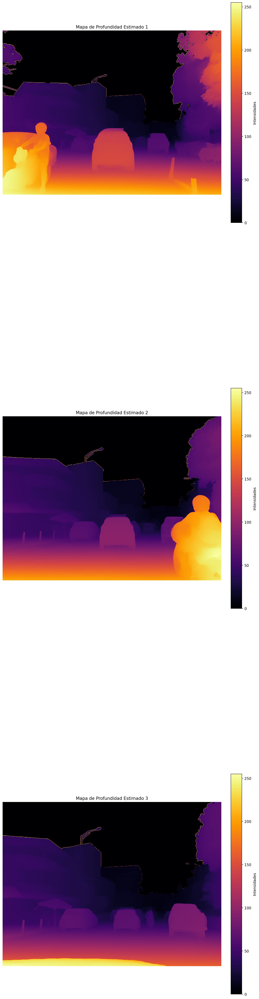

In [ ]:
#@title Inferencia
plt.figure(figsize=(10, 8 * n_images * 2))

# Bucle para cargar, procesar y visualizar cada imagen
for i, image_name in enumerate(selected_images,1):
    image_path = os.path.join(image_dir, image_name)
    image = cv.imread(image_path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image_pil = Image.fromarray(image)

    # Preparar la imagen para el modelo.
    inputs = image_processor(images=image_pil, return_tensors="pt")

    # No se crearán gradientes en este bloque, para reducir el uso de memoria y acelerar el proceso de inferencia.
    with torch.no_grad():
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth

    # Parametros de configuración
    # Cambiar el tamaño de la imagen mediante el método de interpolación.
    prediction = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=image_pil.size[::-1],  # Invertir tamaño para coincidir con la imagen original
        mode="bicubic",  # Polinomio cúbico para interpolar entre los píxeles de la imagen.
        align_corners=False,
    )
    output = prediction.squeeze().cpu().numpy()
    formatted = (output * 255 / np.max(output)).astype("uint8")  # Convertir a uint8 para visualización
    depth_image = Image.fromarray(formatted)

    # Visualizar la imagen original
    plt.subplot(n_images, 1, i)  # n_images filas, 1 columna, índice i
    plt.imshow(image)
    plt.title(f'Imagen Original {i}')
    plt.axis('off')

    # Imagen de profundidad
    plt.subplot(n_images, 1, i)
    plt.imshow(depth_image, cmap='inferno')
    plt.colorbar(plt.cm.ScalarMappable(cmap='inferno', norm=plt.Normalize(vmin=0, vmax=255)), fraction=0.046, pad=0.04).set_label('Intensidades')
    plt.title(f'Mapa de Profundidad Estimado {i}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
#@title Obtener las distancias

# Parámetros de la cámara
focal_length_mm = 26  # Longitud focal en milímetros (26 mm para la lente gran angular)
sensor_width_mm = 7.4  # Tamaño del sensor en milímetros (puedes ajustar según las especificaciones exactas)

# Conversiones
focal_length_px = (focal_length_mm / sensor_width_mm) * image_pil.size[0]  # Convertir la distancia focal a píxeles


def calculate_distance(depth_value, focal_length_px, scale_factor=1.0):
    # depth_value es el valor de profundidad de la imagen predicha
    # focal_length_px es la distancia focal convertida a píxeles

    # Conversión de la profundidad en la imagen a distancia real (en metros)
    distance_meters = scale_factor / (depth_value + 1e-6)

    return distance_meters

In [ ]:
#@title Obtener las distancias de los objetos detectados

for i, image_name in enumerate(selected_images,1):
    image_path = os.path.join(image_dir, image_name)
    image = cv.imread(image_path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image_pil = Image.fromarray(image)

    # Obtener el mapa de profundidad para la imagen
    inputs = image_processor(images=image_pil, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth
        prediction = torch.nn.functional.interpolate(
            predicted_depth.unsqueeze(1),
            size=image_pil.size[::-1],
            mode="bicubic",
            align_corners=False,
        )
        depth_map = prediction.squeeze().cpu().numpy()

    plt.figure(figsize=(10, 8))
    plt.imshow(image_pil)

    # Procesar cada cuadro delimitador (bounding box)
    for score, label, box in zip(probas[keep], probas[keep].argmax(-1), bboxes_scaled):
        # Convertir las coordenadas del bounding box a enteros para usar en el depth map
        xmin, ymin, xmax, ymax = map(int, box.tolist())

        # Obtener el valor de profundidad (depth_value) para el objeto
        depth_value = depth_map[ymin:ymax, xmin:xmax].mean()

        # Calcular la distancia en metros
        distance_meters = calculate_distance(depth_value, focal_length_px)

        # Dibujar la bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, color='red', linewidth=2))

        # Añadir la etiqueta y la distancia estimada como texto
        plt.text(xmin, ymin -10, f'{CLASSES[label.item()]} {distance_meters:.2f} meters', color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

        # Imprimir la bounding box y la distancia estimada
        print(f"Detected {CLASSES[label.item()]} at bounding box {box.tolist()} with a distance of {distance_meters:.2f} meters")


## **Detección de objetos para videos con RT-DETR**

RT-DETR, abreviatura de «Real-Time DEtection TRansformer», es un modelo de visión por ordenador desarrollado por la Universidad de Pekín y Baidu. En su artículo «[DETRs Beat YOLOs on Real-time Object Detection](https://arxiv.org/abs/2304.08069)», los autores afirman que RT-DETR puede superar a los modelos YOLO en la detección de objetos, tanto en velocidad como en precisión. El modelo se ha publicado bajo licencia Apache 2.0, lo que lo convierte en una gran opción, especialmente para proyectos empresariales.

RT-DETR es un modelo de detección de objetos que significa «Real-Time DEtection Transformer». Este modelo está diseñado para realizar tareas de detección de objetos centrándose en lograr un rendimiento en tiempo real manteniendo una alta precisión. Aprovechando la arquitectura del transformador, que ha ganado una popularidad significativa en varios campos del aprendizaje profundo, RT-DETR procesa imágenes para identificar y localizar múltiples objetos dentro de ellas.

In [ ]:
#@title Carga del modelo pre-entrenado
from transformers import RTDetrForObjectDetection, RTDetrImageProcessor

model_name = "PekingU/rtdetr_r50vd_coco_o365" # Modelo específico que ha sido preentrenado y publicado en el Hub de modelos de Hugging Face.
image_processor = RTDetrImageProcessor.from_pretrained(model_name) # Prepocesamiento de las imágenes antes de entrar en el modelo.
rtdetr_model = RTDetrForObjectDetection.from_pretrained(model_name) # El modelo analiza la imagen y devuelve las predicciones.

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/841 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/5.11k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/172M [00:00<?, ?B/s]

In [ ]:
#@title Configuración de dispositivo y resumen del modelo.
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#rtdetr_model.to(device)

RTDetrForObjectDetection(
  (model): RTDetrModel(
    (backbone): RTDetrConvEncoder(
      (model): RTDetrResNetBackbone(
        (embedder): RTDetrResNetEmbeddings(
          (embedder): Sequential(
            (0): RTDetrResNetConvLayer(
              (convolution): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
              (normalization): RTDetrFrozenBatchNorm2d()
              (activation): ReLU()
            )
            (1): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrFrozenBatchNorm2d()
              (activation): ReLU()
            )
            (2): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrFrozenBatchNorm2d()
              (activation): ReLU()
            )
          )
          (pooler): MaxPool2d(

In [ ]:
#@title Inferencia
image = Image.open('/content/BucaraSet/barrio-la-universidad/img/IMG_1.jpg')
inputs = image_processor(images=image, return_tensors="pt")
with torch.no_grad():
  # Pasa los datos preprocesados al modelo RT-DETR para hacer predicciones de detección de objetos
    outputs = rtdetr_model(**inputs)
    # 'target_sizes' proporciona el tamaño original de la imagen para ajustar las predicciones a esa escala.
    # 'threshold=0.6' establece un umbral de confianza, de modo que solo se consideren las detecciones con una confianza mayor al 60%.
results = image_processor.post_process_object_detection(outputs, target_sizes=torch.tensor([image.size[::-1]]), threshold=0.6)

In [ ]:
results

[{'scores': tensor([0.9529, 0.9521, 0.9121, 0.9038, 0.8718, 0.8692, 0.8585, 0.8103, 0.6029]),
  'labels': tensor([2, 7, 2, 0, 0, 0, 3, 3, 2]),
  'boxes': tensor([[   9.9622, 1466.0110, 1114.0549, 1993.1838],
          [2769.5557, 1281.0970, 3515.2878, 1727.0549],
          [2280.5757, 1470.2632, 2459.8032, 1603.3340],
          [1456.2767, 1350.8060, 1723.3361, 1821.1678],
          [1266.4803, 1481.5753, 1368.3199, 1748.4398],
          [1776.8069, 1472.5056, 1854.2495, 1667.4749],
          [1439.4878, 1580.3053, 1712.8955, 1960.9631],
          [3493.0935, 1374.1705, 3704.3877, 1617.1260],
          [2484.8303, 1477.0942, 2535.8879, 1534.6472]])}]

In [ ]:
#@title Registro de inferencia
for result in results:
    for score, label_id, box in zip(result["scores"], result["labels"], result["boxes"]):
        score, label = score.item(), label_id.item()
        box = [round(i, 2) for i in box.tolist()]
        print(f"{rtdetr_model.config.id2label[label]}: {score:.2f} {box}")

car: 0.95 [9.96, 1466.01, 1114.05, 1993.18]
truck: 0.95 [2769.56, 1281.1, 3515.29, 1727.05]
car: 0.91 [2280.58, 1470.26, 2459.8, 1603.33]
person: 0.90 [1456.28, 1350.81, 1723.34, 1821.17]
person: 0.87 [1266.48, 1481.58, 1368.32, 1748.44]
person: 0.87 [1776.81, 1472.51, 1854.25, 1667.47]
motorbike: 0.86 [1439.49, 1580.31, 1712.9, 1960.96]
motorbike: 0.81 [3493.09, 1374.17, 3704.39, 1617.13]
car: 0.60 [2484.83, 1477.09, 2535.89, 1534.65]


In [ ]:
from transformers import pipeline

pipe = pipeline(model=model_name)
pipe(image)

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


[{'score': 0.9529331922531128,
  'label': 'car',
  'box': {'xmin': 9, 'ymin': 1466, 'xmax': 1114, 'ymax': 1993}},
 {'score': 0.9520716667175293,
  'label': 'truck',
  'box': {'xmin': 2769, 'ymin': 1281, 'xmax': 3515, 'ymax': 1727}},
 {'score': 0.9120875597000122,
  'label': 'car',
  'box': {'xmin': 2280, 'ymin': 1470, 'xmax': 2459, 'ymax': 1603}},
 {'score': 0.9038221836090088,
  'label': 'person',
  'box': {'xmin': 1456, 'ymin': 1350, 'xmax': 1723, 'ymax': 1821}},
 {'score': 0.8718233108520508,
  'label': 'person',
  'box': {'xmin': 1266, 'ymin': 1481, 'xmax': 1368, 'ymax': 1748}},
 {'score': 0.8691747188568115,
  'label': 'person',
  'box': {'xmin': 1776, 'ymin': 1472, 'xmax': 1854, 'ymax': 1667}},
 {'score': 0.8585279583930969,
  'label': 'motorbike',
  'box': {'xmin': 1439, 'ymin': 1580, 'xmax': 1712, 'ymax': 1960}},
 {'score': 0.8103465437889099,
  'label': 'motorbike',
  'box': {'xmin': 3493, 'ymin': 1374, 'xmax': 3704, 'ymax': 1617}},
 {'score': 0.6029340624809265,
  'label': 'c

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_bbox(image, data):
   # Create a figure and axes
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image)

    for result in results:
        for score, label_id, box in zip(result["scores"], result["labels"], result["boxes"]):
            # Unpack the bounding box coordinates
            x1, y1, x2, y2 = box
            # Create a Rectangle patch
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
            # Add the rectangle to the Axes
            ax.add_patch(rect)
            # Annotate the label
            label = model.config.id2label[label_id.item()]
            plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

        # Remove the axis ticks and labels
        ax.axis('off')

    # Show the plot
    plt.show()

In [ ]:
# Configuraciones iniciales
video_dir = '/content/BucaraSet/parque-meson-bucaros/vid/'
output_dir = '/content/drive/MyDrive/parque-meson-bucaros/'
device = 'cuda'  # Asumiendo que se usa CUDA

# Asegúrate de que el directorio de salida existe
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def process_video(video_path, output_path):
    cap = cv.VideoCapture(video_path)
    fps = cap.get(cv.CAP_PROP_FPS)
    width = int(cap.get(cv.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv.VideoWriter_fourcc(*'mp4v')
    out = cv.VideoWriter(output_path, fourcc, fps, (width, height))

    frame_count = 0
    last_detections = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Procesar cada fotograma aquí, igual que en tu código original
        if frame_count % 1 == 0:
            image = Image.fromarray(cv.cvtColor(frame, cv.COLOR_BGR2RGB))
            inputs = image_processor(images=image, return_tensors="pt").to(device)
            with torch.no_grad():
                outputs = rtdetr_model(**inputs)
            results = image_processor.post_process_object_detection(outputs, target_sizes=torch.tensor([image.size[::-1]]), threshold=0.6)
            last_detections = []
            for result in results:
                for score, label_id, box in zip(result["scores"], result["labels"], result["boxes"]):
                    box = [int(i) for i in box.tolist()]
                    label = rtdetr_model.config.id2label[label_id.item()]
                    last_detections.append((box, label, score.item()))

        # Dibujar y escribir fotogramas
        for box, label, score in last_detections:
            x1, y1, x2, y2 = box
            cv.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv.putText(frame, f"{label}: {score:.2f}", (x1, y1 - 10), cv.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
        out.write(frame)
        frame_count += 1

    cap.release()
    out.release()
    print(f"Processed {frame_count} frames and saved to {output_path}")

# Bucle para recorrer los videos
for i in range(1, 14):  # Desde VID-01.mp4 hasta VID-13.mp4
    video_path = os.path.join(video_dir, f'video-{i:02}.mp4')
    output_path = os.path.join(output_dir, f'output-{i}.mp4')
    process_video(video_path, output_path)

Aprendizaje semi-supervisado con pseudo-etiquetas

# Inferencia con uso de pseudo-labels - Entrenamiento con Pseudo-Labels

In [ ]:
import os
from PIL import Image
from transformers import RTDetrForObjectDetection, RTDetrImageProcessor
import torch

# Ruta a la carpeta con las imágenes
image_folder = '/content/BucaraSet/autopista-floridablanca/dia/'

# Obtener todas las rutas de las imágenes en la carpeta
image_paths = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Cargar el modelo preentrenado
model_name = "PekingU/rtdetr_r50vd_coco_o365"
image_processor = RTDetrImageProcessor.from_pretrained(model_name)
rtdetr_model = RTDetrForObjectDetection.from_pretrained(model_name)

pseudo_labels = []  # Lista para almacenar las pseudo etiquetas

# Realizar inferencia en cada imagen
for img_path in image_paths:
    image = Image.open(img_path)
    inputs = image_processor(images=image, return_tensors="pt")

    with torch.no_grad():
        outputs = rtdetr_model(**inputs)
        results = image_processor.post_process_object_detection(outputs,
                                                                target_sizes=torch.tensor([image.size[::-1]]),
                                                                threshold=0.6)

    pseudo_labels.append(results)  # Guardar pseudo etiquetas
    print(f"Pseudo labels for {img_path}: {results}")




Pseudo labels for /content/BucaraSet/autopista-floridablanca/dia/IMG_2.png: [{'scores': tensor([0.9181, 0.9044, 0.8991, 0.8979, 0.8826, 0.8367, 0.8231, 0.8142, 0.7531,
        0.7300, 0.7048, 0.6603, 0.6417, 0.6394]), 'labels': tensor([7, 7, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2]), 'boxes': tensor([[1416.3805, 2463.8845, 1670.3658, 3079.5117],
        [2581.0720, 2160.4751, 3019.4910, 2485.1025],
        [1923.3142, 3135.4939, 2258.5059, 3727.2129],
        [1046.8424, 2757.4956, 1277.9326, 3134.2537],
        [1522.2622, 1649.1183, 1623.5502, 1767.3108],
        [1499.0781, 1505.9717, 1592.1399, 1607.8357],
        [ 800.2794, 3328.6741,  901.4009, 3543.5610],
        [1241.6804, 2140.5154, 1406.0818, 2363.3071],
        [1656.7924, 1522.6473, 1742.6918, 1629.0646],
        [1678.4799, 1879.2426, 1801.3518, 2043.2958],
        [1162.5173, 2324.4487, 1366.1591, 2667.4419],
        [ 843.3077, 3209.2085,  935.1534, 3402.0715],
        [2173.2131, 2303.4766, 2233.6421, 2439.0037],
        [